## Importing Libraries

In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
@author: suraj
"""

#%matplotlib notebook
from tqdm import tqdm

# Module to handle regular expressions
import re

# Module required for string manipulations
import string

# Manage files
import os

# Library for emoji cleaning and recognition
import emoji
import demoji

# Import pandas and numpy to handle data
import pandas as pd
import numpy as np

# Import libraries for visualization
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
from PIL import Image

#Import nltk to check english lexicon
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import (wordnet, stopwords)

#To anotate database
from pycorenlp import StanfordCoreNLP

# Library for assigning sentiments
from textblob import TextBlob

# Tools for Vectorization
import sklearn
from sklearn.preprocessing import Normalizer
from sklearn.feature_extraction.text import (CountVectorizer, TfidfVectorizer)
# demoji.download_codes()

In [2]:
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package wordnet to /home/suraj/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /home/suraj/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/suraj/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

## Function Required for Cleaning Tweets

#### Compiling emojis

In [2]:
#HappyEmoticons
emoticons_happy = set([':-)', ';)', ':o', ':]', '8)', '=)', ':-D', ':D', '=D',
                       ':*', ':-P', ':P', ':-p', ':p', '=p','<3', '^_^', '=O:)', '=:-*'])

# Check validity of some of the emojis code in above list
# Sad Emoticons
emoticons_sad = set([':-/', ':-(', ':[','=/', '>:(', ':(', '>.<', ":'-(", ":'(", '-_-', '<(“)', '=3:)',
                     ':-/', '>:-('])

#Emoji patterns
emoji_pattern = re.compile("["
         u"\U0001F600-\U0001F64F"  # emoticons
         u"\U0001F300-\U0001F5FF"  # symbols & pictographs
         u"\U0001F680-\U0001F6FF"  # transport & map symbols
         u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
         u"\U00002702-\U000027B0"
         u"\U000024C2-\U0001F251"
         "]+", flags=re.UNICODE)
# emoji_pattern = re.compile(
#     u"(\ud83d[\ude00-\ude4f])|"  # emoticons
#     u"(\ud83c[\udf00-\uffff])|"  # symbols & pictographs (1 of 2)
#     u"(\ud83d[\u0000-\uddff])|"  # symbols & pictographs (2 of 2)
#     u"(\ud83d[\ude80-\udeff])|"  # transport & map symbols
#     u"(\ud83c[\udde0-\uddff])"  # flags (iOS)
#     "+", flags=re.UNICODE)
#combine sad and happy emoticons
emoticons = emoticons_happy.union(emoticons_sad)

* Following are some of the redundant notations I found for some emojis
***
 ':3', ':c)', ':>', '=]',':}', ':^)', ':-b', ':b', '>:)', '>;)', '>:-)', 'X-P',
     'x-p', 'xp', 'XP', '8-D', '8D', 'x-D', 'xD', 'X-D', 'XD', '=-D', '=-3', 
     '=3', ':-))', ":'-)", ":'),':^*'", ,'>:P'
     
***


In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.expand_frame_repr', False)
pd.set_option('max_colwidth', None)
pd.set_option('display.max_rows', None)

* For displaying whole dataset inside notebook

In [4]:
def preprocessing_text(table):
    # Put everythin in lowercase
    table['tweet'] = table['tweet'].str.lower()
    
    # Replace rt indicating that was a retweet
    table['tweet'] = table['tweet'].str.replace('rt', '')
    
    # Replace occurences of mentioning @UserNames
    table['tweet'] = table['tweet'].replace(r'@\w+', '', regex=True)
    
    # Replace links contained in the tweet
    table['tweet'] = table['tweet'].replace(r'http\S+', '', regex=True)
    table['tweet'] = table['tweet'].replace(r'www.[^ ]+', '', regex=True)
    
    # Remove numbers
    table['tweet'] = table['tweet'].replace(r'[0-9]+', '', regex=True)
    
    # Replace special characters and puntuation marks
    table['tweet'] = table['tweet'].replace(r'[!"#$%&()*+,-./:;<=>?@[\]^_`{|}~]', '', regex=True)
    
    # Removes we'll 've
    # table['tweet'] = table['tweet'].replace(r"(\w+)?['’]+(\w+)?(\s+)?([.]+)?", ' ', regex=True)
    
    # Removes some specific characters to text
    table['tweet'] = table['tweet'].replace(r"[…\.“”③•—₹]+", ' ', regex=True)
    table['tweet'] = table['tweet'].replace(r"[\\]n", ' ', regex=True)
    
    # Removes trailing characters
    table['tweet'] = table['tweet'].replace(r"[\W]+$", ' ', regex=True)
    return table

* Preprocess text in tweets by removing links, @UserNames, blank spaces, any other special characters specific to text etc. using regex.

In [5]:
def removeemoji(tweet):
    tweet = emoji_pattern.sub(r'', tweet)
    return tweet

* This function removes emojis from passed tweet using above custom compiled set

In [6]:
#Replace elongated words by identifying those repeated characters and then remove them and compare the new word with the english lexicon
def in_dict(word):
    if wordnet.synsets(word):
        #if the word is in the dictionary, we'll return True
        return True

def replace_elongated_word(word):
    regex = r'(\w*)(\w+)\2(\w*)'
    repl = r'\1\2\3'
    if in_dict(word):
        return word
    new_word = re.sub(regex, repl, word)
    if new_word != word:
        return replace_elongated_word(new_word)
    else:
        return new_word

def detect_elongated_words(row):
    regexrep = r'(\w*)(\w+)(\2)(\w*)'
    words = [''.join(i) for i in re.findall(regexrep, row)]
    for word in words:
        if not in_dict(word):
            row = re.sub(word, replace_elongated_word(word), row)
    return row

* These function recognizes redundant repeating characters in a word and replace them with words present in nltk dictionary 

In [7]:
def stop_words(table):
    #We need to remove the stop words
    stop_words_list = stopwords.words('english')
    table['tweet'] = table['tweet'].str.lower()
    table['tweet'] = table['tweet'].apply(lambda x: ' '.join(
        [word for word in x.split() if word not in (stop_words_list) and word not in emoticons and word not in string.punctuation]))
    return table

def remove_single_characters(table):
    table['tweet'] = table['tweet'].str.lower()
    table['tweet'] = table['tweet'].apply(lambda x:' '.join(
        [word for word in x.split() if len(word) != 1]))
    return table

* These functions removes stopwords and single character words from a tweet 

In [8]:
def replace_antonyms(word):
    #We get all the lemma for the word
    for syn in wordnet.synsets(word):
        for lemma in syn.lemmas():
            #if the lemma is an antonyms of the word
            if lemma.antonyms():
                #we return the antonym
                return lemma.antonyms()[0].name()
    return word

def handling_negation(row):
    #Tokenize the row
    words = word_tokenize(row)
    speach_tags = ['JJ', 'JJR', 'JJS', 'NN', 'VB', 'VBD', 'VBG', 'VBN', 'VBP']
    #We obtain the type of words that we have in the text, we use the pos_tag function
    tags = nltk.pos_tag(words)
    #Now we ask if we found a negation in the words
    tags_2 = ''
    if "n't" in words and "not" in words:
        tags_2 = tags[min(words.index("n't"), words.index("not")):]
        words_2 = words[min(words.index("n't"), words.index("not")):]
        words = words[:(min(words.index("n't"), words.index("not")))+1]
    elif "n't" in words:
        tags_2 = tags[words.index("n't"):]
        words_2 = words[words.index("n't"):]
        words = words[:words.index("n't")+1]
    elif "not" in words:
        tags_2 = tags[words.index("not"):]
        words_2 = words[words.index("not"):]
        words = words[:words.index("not")+1]

    for index, word_tag in enumerate(tags_2):
        if word_tag[1] in speach_tags:
            words = words+[replace_antonyms(word_tag[0])]+words_2[index+2:]
            break
    return ' '.join(words)

* These function recognize words with not or any negative element around them and replace it with respective antonym
* Here is an example

`
stri = handling_negation("food wasn't bad")
print(stri)
`

*It results*

`
food wasn't good
`

In [9]:
def preprocessing_text2(table):
    # removes we'll 've
    table['tweet'] = table['tweet'].replace(r"['’]+(\w+)?(\s+)?([.]+)?", ' ', regex=True)
    return table

* Some extra preprocessing required after running handling negation function 


## Functions for Data Visualization

##### After we have cleaned our data but before we start building our model for sentiment analysis, we can perform an exploratory data analysis to see what are the most frequent words that appear in our tweets. For this part, we will show graphs regarding tweets labelled as positive separated from those labelled as negative.

In [10]:
def vectorization(table):
    #Initialize
    vector = CountVectorizer()
    
    #We fit and transform the vector created
    frequency_matrix = vector.fit_transform(table.tweet)
    
    #Sum all the frequencies for each word
    sum_frequencies = np.sum(frequency_matrix, axis=0)
    
    #Now we use squeeze to remove single-dimensional entries from the shape of an array that we got from applying np.asarray to
    #the sum of frequencies.
    frequency = np.squeeze(np.asarray(sum_frequencies))
    
    #Now we get into a dataframe all the frequencies and the words that they correspond to
    frequency_df = pd.DataFrame([frequency], columns=vector.get_feature_names()).transpose()
    return frequency_df

* Vectorization for Data Visualization
* CountVectorizer will convert a collection of text documents to a matrix of token counts
* Hence, Produces a sparse 0 of the counts

In [33]:
def word_cloud(tweets):

    #We get the directory that we are working on
    file = os.getcwd()
    #We read the mask image into a numpy array
    twitter_mask = np.array(Image.open(os.path.join(file, "index.jpeg")))
    #Now we store the tweets into a series to be able to process
    #tweets_list = pd.Series([t for t in tweet_table.tweet]).str.cat(sep=' ')
    #We generate the wordcloud using the series created and the mask
    word_cloud = WordCloud(width=2000, height=1000, max_font_size=200, background_color="black", max_words=2000,mask=twitter_mask, contour_width=1,
                           contour_color="steelblue", colormap="nipy_spectral", stopwords=["avengers"])
    word_cloud.generate(tweets)

    #wordcloud = WordCloud(width=1600, height=800,max_font_size=200).generate(tweets_list)

    #Now we plot both figures, the wordcloud and the mask
    #plt.figure(figsize=(15,15))
    plt.figure(figsize=(10,10))
    plt.imshow(word_cloud, interpolation="hermite")
    plt.axis("off")
    #plt.imshow(avengers_mask, cmap=plt.cm.gray, interpolation="bilinear")
    #plt.axis("off")
#     plt.savefig("wordCloud1", dpi=None, facecolor='w', edgecolor='w',
#         orientation='portrait', papertype=None, format="pdf",
#         transparent=False, bbox_inches=None, pad_inches=0.1,
#         frameon=None, metadata=None)
    plt.show()

In [32]:
def graph(word_frequency, sent):
    labels = word_frequency[0][1:51].index
    title = "Word Frequency for %s" %sent
    #Plot the figures
    plt.figure(figsize=(10,5))
    plt.bar(np.arange(50), word_frequency[0][1:51], width = 0.8, color = sns.color_palette("bwr"), alpha=0.5,
            edgecolor = "black", capsize=8, linewidth=1);
    plt.xticks(np.arange(50), labels, rotation=90, size=14);
    plt.xlabel("50 more frequent words", size=14);
    plt.ylabel("Frequency", size=14);
    #plt.title('Word Frequency for %s', size=18) %sent;
    plt.title(title, size=18)
    plt.grid(False);
    plt.gca().spines["top"].set_visible(False);
    plt.gca().spines["right"].set_visible(False);
#     plt.savefig("Graph", dpi=None, facecolor='w', edgecolor='w',
#         orientation='portrait', papertype=None, format="jpeg",
#         transparent=False, bbox_inches=None, pad_inches=0.1,
#         frameon=None, metadata=None)
    plt.show()

def regression_graph(table):
    table = table[1:]
    #We set the style of seaborn
    sns.set_style("whitegrid")
    #Initialize the figure
    plt.figure(figsize=(6,6))

    #we obtain the points from matplotlib scatter
    points = plt.scatter(table["Positive"], table["Negative"], c=table["Positive"], s=75, cmap="bwr")
    #graph the colorbar
    plt.colorbar(points)
    #we graph the regplot from seaborn
    sns.regplot(x="Positive", y="Negative",fit_reg=False, scatter=False, color=".1", data=table)
    plt.xlabel("Frequency for Positive Tweets", size=14)
    plt.ylabel("Frequency for Negative Tweets", size=14)
    plt.title("Word frequency in Positive vs. Negative Tweets", size=14)
#     plt.savefig("Regression Graph", dpi=None, facecolor='w', edgecolor='w',
#         orientation='portrait', papertype=None, format="jpeg",
#         transparent=False, bbox_inches=None, pad_inches=0.1,
#         frameon=None, metadata=None)
    plt.grid(False)
    sns.despine()

## Importing Data and Cleaning Tweets

In [13]:
dataframe = pd.read_excel("/home/suraj/OneDrive/ML Problems/Food Reviews/tweets.xlsx")
print("Columns in dataframe: ", dataframe.columns)
print("Shape of Data: ", dataframe.shape)

Columns in dataframe:  Index(['Unnamed: 0', 'contributors', 'coordinates', 'created_at',
       'display_text_range', 'entities', 'extended_entities', 'extended_tweet',
       'favorite_count', 'favorited', 'filter_level', 'geo', 'id', 'id_str',
       'in_reply_to_screen_name', 'in_reply_to_status_id',
       'in_reply_to_status_id_str', 'in_reply_to_user_id',
       'in_reply_to_user_id_str', 'is_quote_status', 'lang', 'place',
       'possibly_sensitive', 'quote_count', 'quoted_status',
       'quoted_status_id', 'quoted_status_id_str', 'quoted_status_permalink',
       'reply_count', 'retweet_count', 'retweeted', 'retweeted_status',
       'source', 'text', 'timestamp_ms', 'truncated', 'user'],
      dtype='object')
Shape of Data:  (10108, 37)


In [14]:
Req_dataframe = dataframe['text']
Req_dataframe = Req_dataframe.to_frame()
Req_dataframe.columns = ['tweet']
Req_dataframe

,tweet
0,"@temporalthought No hehe I mean when you order from Honestbee, they put your order in a ecobag. Yung foodpanda walang ganung pauso."
1,@BikashT61610948 @BhuwaniaAkash @Zomato @ZomatoIN @JagoGrahakJago_ @jagograhakjago @BharatCourt We are trying to re… https://t.co/tvr3REqXWj
2,@zomatocare @BhuwaniaAkash @Zomato @ZomatoIN @JagoGrahakJago_ @jagograhakjago @BharatCourt 7003677593
3,RT @swiggy_in: Get 50% off on your first 3 Swiggy orders! Use code GRAB50 at checkout. Max. discount: ₹100/order. TCA. https://t.co/bk2m2u…
4,"Never use @Zomato food service, they deliver worst quality food and there help desk executive had no politness.… https://t.co/0vM6OJadjP"
5,"@zomatocare @ZomatoIN Hi, I want a refund for my Zomato gold membership, I bought it at a separate set of T&amp;C's we… https://t.co/SV7lyOfZI6"
6,"@SwiggyCares horrible experience with swiggy today. Received bad quality food from subway, Had a word with custome… https://t.co/AzD70AKYWd"
7,Very bad service.
8,Is the policy change even allowed after PPL buy Zomato Gold membership? @ZomatoIN https://t.co/aEULlvQEIc
9,RT @kinlag: ส่งฟรีมีอยู่จริง!กับไก่ทอดร้านโปรด @bonchonthailand เพียงแค่เข้าแอพ Foodpanda กดสั่งแล้วรอสักแปปไก่ร้อนๆก็จัดส่งถึงหน้าบ้านเลย…


* Made seperate dataframe from text column of original available data

In [15]:
obtained_dataframe = preprocessing_text(Req_dataframe)

obtained_dataframe['tweet'] = obtained_dataframe['tweet'].apply(lambda x: handling_negation(x))

* Basic cleaning plus handling negations present in tweets

In [16]:
# obtained_dataframe.to_csv(r'/home/suraj/OneDrive/ML Problems/Twitter Project Work/Extraction Tools/preProcessedText.csv', index = False)

In [17]:
single_wordframe = obtained_dataframe[obtained_dataframe['tweet'].apply(lambda x: len(x.split(' ')) == 1)]
print("number of tweets with length 1: ", single_wordframe.shape)
empty_wordframe = obtained_dataframe[obtained_dataframe['tweet'].apply(lambda x: x == "")]
print("number of empty row in tweet dataframe: ", empty_wordframe.shape)

number of tweets with length 1:  (364, 1)
number of empty row in tweet dataframe:  (188, 1)


In [18]:
for i,j in zip(obtained_dataframe['tweet'], range(0,obtained_dataframe.shape[0])):
    i = " ".join((i).split())
    obtained_dataframe.iloc[j,0] = i

* Removes multiple spaces between words

In [19]:
obtained_dataframe.drop(obtained_dataframe[obtained_dataframe['tweet'] == ""].index, inplace=True)
obtained_dataframe.drop(obtained_dataframe[obtained_dataframe['tweet'] == " "].index, inplace=True)
obtained_dataframe.reset_index(inplace=True, drop=True)
print("Remaining rows after removing empty rows: ", obtained_dataframe.shape)

Remaining rows after removing empty rows:  (9920, 1)


In [21]:
# obtained_dataframe.to_csv(r'/home/suraj/OneDrive/ML Problems/Twitter Project Work/Extraction Tools/preProcessedText.csv', index = False)

In [20]:
obtained_dataframe = preprocessing_text2(obtained_dataframe)
print("Dataframe after basic cleaning")
obtained_dataframe

Dataframe after basic cleaning


,tweet
0,no hehe i mean when you order from honestbee they put your order in a ecobag yung foodpanda walang ganung pauso
1,we are trying to re
2,get off on your first swiggy orders use code grab at checkout max discount order tca
3,never use food service they deliver worst quality food and there help desk executive had no politness
4,hi i want a refund for my zomato gold membership i bought it at a separate set of tampc we
5,horrible experience with swiggy today received bad quality food from subway had a word with custome
6,very bad service
7,is the policy change even allowed after ppl buy zomato gold membership
8,ส่งฟรีมีอยู่จริงกับไก่ทอดร้านโปรด เพียงแค่เข้าแอพ foodpanda กดสั่งแล้วรอสักแปปไก่ร้อนๆก็จัดส่งถึงหน้าบ้านเลย
9,the most amazing food delivery app i have never seen bz it does n deliver food even after hrs of order you m


* using following code I obtained if there is any inverted commas left in text

`for i in obtained_dataframe['tweet']:
    for line in re.findall("['’]+(\w+)?(\s+)?([.]+)?", i):
        print(line)`
        
**Result: No such tweet available after doing basic cleaning**

In [23]:
obtained_dataframe = stop_words(obtained_dataframe)

for i,j in zip(obtained_dataframe['tweet'], range(0,obtained_dataframe.shape[0])):
    i = removeemoji(i)
    obtained_dataframe.iloc[j,0] = i
    
for i,j in zip(obtained_dataframe['tweet'], range(0,obtained_dataframe.shape[0])):
    i = demoji.replace(i, " ")
    obtained_dataframe.iloc[j,0] = i

* Removed StopWords and emojis using demoji library and custom made function

In [24]:
print("DataFrame after removing emojis and stopwords- ")
obtained_dataframe

DataFrame after removing emojis and stopwords- 


,tweet
0,hehe mean order honestbee put order ecobag yung foodpanda walang ganung pauso
1,trying
2,get first swiggy orders use code grab checkout max discount order tca
3,never use food service deliver worst quality food help desk executive politness
4,hi want refund zomato gold membership bought separate set tampc
5,horrible experience swiggy today received bad quality food subway word custome
6,bad service
7,policy change even allowed ppl buy zomato gold membership
8,ส่งฟรีมีอยู่จริงกับไก่ทอดร้านโปรด เพียงแค่เข้าแอพ foodpanda กดสั่งแล้วรอสักแปปไก่ร้อนๆก็จัดส่งถึงหน้าบ้านเลย
9,amazing food delivery app never seen bz n deliver food even hrs order


In [25]:
print("Dataframe shape to check any mishap: ", obtained_dataframe.shape)

Dataframe shape to check any mishap:  (9920, 1)


In [26]:
for i,j in zip(obtained_dataframe['tweet'], range(0,obtained_dataframe.shape[0])):
    i = " ".join((i).split())
    obtained_dataframe.iloc[j,0] = i

obtained_dataframe = remove_single_characters(obtained_dataframe)

for i,j in zip(obtained_dataframe['tweet'], range(0,obtained_dataframe.shape[0])):
    i = " ".join((i).split())
    obtained_dataframe.iloc[j,0] = i

* Removed any extra white space characters and deleted any single character words present in tweets

* Tried text normalization using spacy module 

`import en_core_web_sm`
`nlp = en_core_web_sm.load()`

`doc = nlp(processed['tweet'][0])`

`lemma_word1 = []` 
`for token in doc:
    lemma_word1.append(token.lemma_)`
    
`s = ""`

`print(' '.join(lemma_word1)`

**Result: No noticiable changes observed in model validation accuracy**

In [27]:
obtained_dataframe.drop_duplicates(subset=['tweet'], keep='first', inplace=True)
obtained_dataframe.reset_index(inplace=True, drop=True)
print("Remaining rows after removing duplicate tweets: ", obtained_dataframe.shape)

Remaining rows after removing duplicate tweets:  (7075, 1)


In [28]:
obtained_dataframe.to_csv(r'/home/suraj/OneDrive/ML Problems/Twitter Project Work/Extraction Tools/ProcessedText.csv', index = False)

* Storing cleaned data in a CSV file for using it directly for further use

### Importing filtered english text for labelling Sentiment

#### Have handled language detection and filtering dataframe accordingly into a different notebook, exported csv file is used here for further processing 

In [21]:
df = pd.read_csv("FinalProcessedText.csv")
print("Number of rows in dataframe: ", df.shape)
print("Columns present in Dataframe: ", df.columns)

Number of rows in dataframe:  (5923, 1)
Columns present in Dataframe:  Index(['tweet'], dtype='object')


In [22]:
processed = df['tweet'].apply(lambda x: detect_elongated_words(x))
processed = processed.to_frame()
processed

,tweet
0,get first swigy orders use code grab checkout max discount order tca
1,never use food service deliver worst quality food help desk executive politnes
2,hi want refund zomato gold membership bought separate set tampc
3,horrible experience swigy today received bad quality food subway word custome
4,policy change even allowed pl buy zomato gold membership
5,amazing food delivery ap never seen bz deliver food even hrs order
6,review paji amp sons paschim vihar
7,hunger tweets help handle get swigy ap
8,situations usually open swigy ap order something regret next morning
9,scrolling fodpanda could decide eat closed ap dia keluar notification ni ay


* Works similar to lemmatization and text normalization which I already mentioned don't have much affect on our model validation accuracy

In [23]:
emoji_list = []
def extract_emojis(str):
    emoji_list.append(''.join(c for c in str if c in emoji.UNICODE_EMOJI)) 
for i in obtained_dataframe['tweet']:
    extract_emojis(i)
print(emoji_list)

['', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '😎🍹', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '😎🍹', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '🙂', '', '', '', '', '', '', '', '', '🤗', '😮', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '😎', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '🍕📷', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '', '

* Checks if any emoji is left in tweets even after preprocessing

In [24]:
processed['Polarity'] = 0
processed['Subjectivity'] = 0
for i,j in zip(processed['tweet'], range(0,processed.shape[0])):
    blob = TextBlob(i)
    processed.iloc[j,1] = blob.sentiment.polarity
    processed.iloc[j,2] = blob.sentiment.subjectivity

* Obtained sentiment score of tweets using textblob nltk
* Gives sentiment score in range -1 to 1

In [25]:
print("This is how our dataframe looks now: ")
processed

This is how our dataframe looks now: 


,tweet,Polarity,Subjectivity
0,get first swigy orders use code grab checkout max discount order tca,2.500000e-01,0.333333
1,never use food service deliver worst quality food help desk executive politnes,-1.000000e+00,1.000000
2,hi want refund zomato gold membership bought separate set tampc,0.000000e+00,0.000000
3,horrible experience swigy today received bad quality food subway word custome,-8.500000e-01,0.833333
4,policy change even allowed pl buy zomato gold membership,0.000000e+00,0.000000
5,amazing food delivery ap never seen bz deliver food even hrs order,6.000000e-01,0.900000
6,review paji amp sons paschim vihar,0.000000e+00,0.000000
7,hunger tweets help handle get swigy ap,0.000000e+00,0.000000
8,situations usually open swigy ap order something regret next morning,0.000000e+00,0.250000
9,scrolling fodpanda could decide eat closed ap dia keluar notification ni ay,-1.000000e-01,0.100000


### Visualization

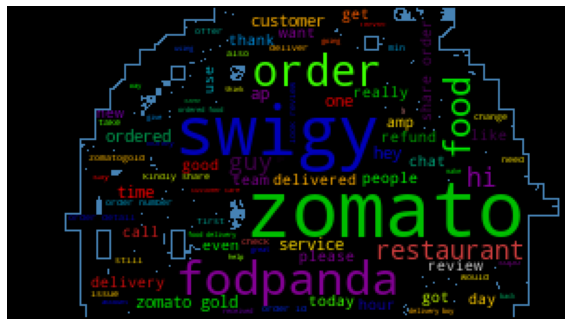

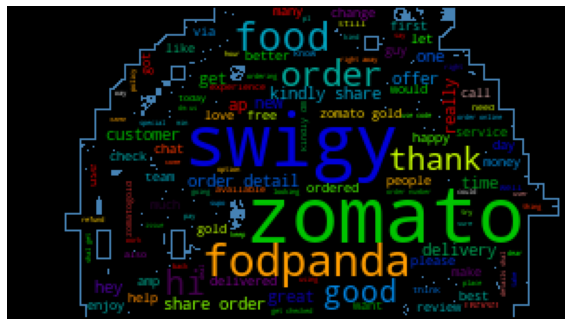

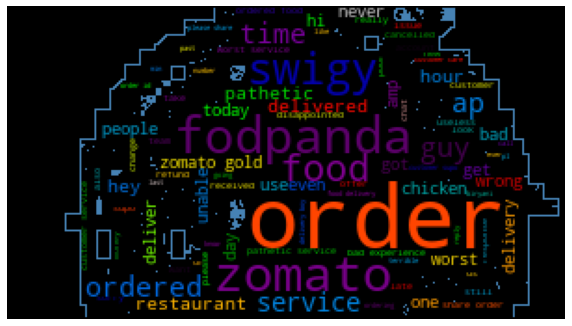

In [34]:
word_cloud(pd.Series([t for t in processed.tweet]).str.cat(sep=' '))  
#For positive tweets 
word_cloud(pd.Series([t for t in processed[processed.Polarity > 0].tweet]).str.cat(sep=' '))  
#For negative tweets
word_cloud(pd.Series([t for t in processed[processed.Polarity < 0].tweet]).str.cat(sep=' '))

In [40]:
word_frequency = vectorization(processed).sort_values(0, ascending = False)
word_frequency_pos = vectorization(processed[processed['Polarity'] > 0]).sort_values(0, ascending = False)
word_frequency_neg = vectorization(processed[processed['Polarity'] < 0]).sort_values(0, ascending = False)

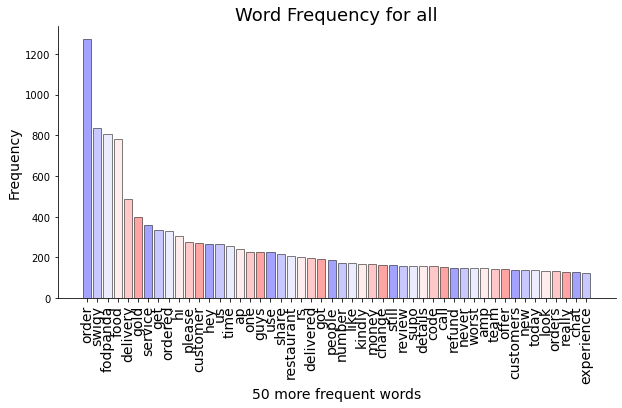

In [37]:
#Graph with frequency words all, positive and negative tweets and get the frequency
graph(word_frequency, 'all')

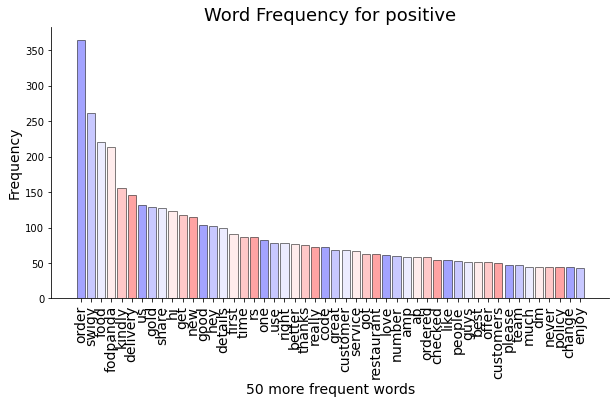

In [38]:
graph(word_frequency_pos, 'positive')

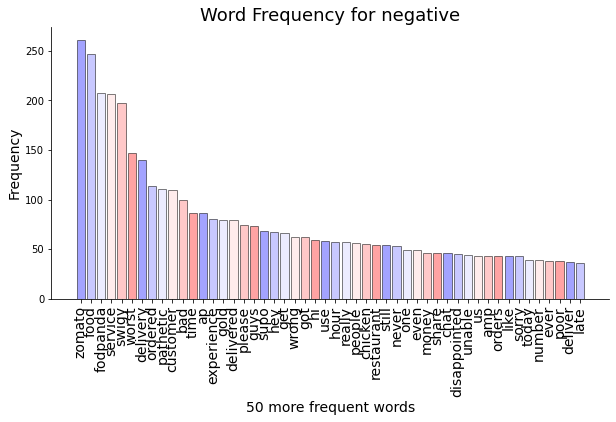

In [39]:
graph(word_frequency_neg, 'negative')

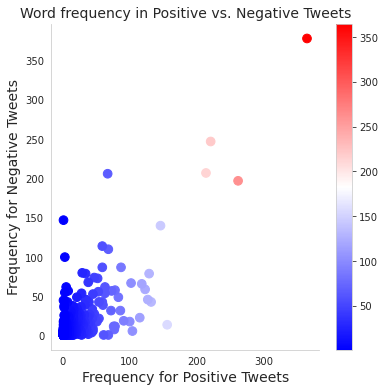

In [36]:
#Concatenate word frequency for positive and negative
table_regression = pd.concat([word_frequency_pos, word_frequency_neg], axis=1, sort=False)
table_regression.columns = ["Positive", "Negative"]
regression_graph(table_regression)

In [37]:
processed.rename(columns={'Polarity': 'sentiment'},inplace=True)
processed['sentiment'] = processed['sentiment'].apply(lambda x: 2 if x > 0 else (1 if x==0 else 0))

* Labelling tweets with score -
 * greater than zero as positive and with value 2
 * less than zero as negative and with value 0
 * equal to zero as neutral and with value 1


In [38]:
processed.to_csv(r'/home/suraj/OneDrive/ML Problems/Twitter Project Work/Extraction Tools/SentimentProcessedText1.csv', index = False)

* Exporting data with sentiment scores into a csv file for using it in model building using deep learning 

In [39]:
# from watson_developer_cloud import NaturalLanguageUnderstandingV1
# from watson_developer_cloud.natural_language_understanding_v1 import Features, EntitiesOptions, KeywordsOptions, SentimentOptions, CategoriesOptions
# natural_language_understanding = NaturalLanguageUnderstandingV1(                                         
#     version='2018-11-16',
#     iam_apikey="mWRgLr5Ou_8NP8NlxnB9tGJ3hy2Oo5qYdIm6YyIXMZ2B", 
#     url="https://gateway-lon.watsonplatform.net/natural-language-understanding/api")

# def Sentiment_score(input_text): 
#     # Input text can be sentence, paragraph or document
#     response = natural_language_understanding.analyze (
#     text = input_text,
#     features = Features(sentiment=SentimentOptions())).get_result()
#     # From the response extract score which is between -1 to 1
#     res = response.get('sentiment').get('document').get('score')
#     return res


# # In[34]:


# # processed['Polarity_IBM'] = 0
# # for i,j in zip(processed['tweet'], range(0,processed.shape[0])):
# #     score = Sentiment_score(i)
# #     processed.iloc[j,3] = score

* Planning to use IBM watson natural language kit for sentiment scores rather than text blob